In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities

# Flows algorithm to create an adjacency matrix of industry pairs

## Data
* Join 5 years of ASHE sample, in this case 
    * from 2009 to 2013 
    * from 2014 to 2018. 
   
This can change in the future depending which matrix we want to build (2 years, 5 years, 10 years, etc).

## Selection:
* Select individuals with no missing data in age, sic07, personal id or work postcode variables. 
* Select individuals with age > 15 & age < 65.

* Loop over each unique individual in the dataset (unique "piden"):
     - Select all inputs observed for that individual into a table. e.g, for individual with "piden"==1 :
        
| piden | year | sic07 |work postcode |
|-------|------|-------|--------------|
| 1     | 2009 | A     | A1           |
| 1     | 2010 | A     | A1           |
| 1     | 2010 | B     | B1           |
| 1     | 2011 | C     | C1           |
| 1     | 2013 | D     | D1           |
| 1     | 2013 | D     | D2           |


## Algorithm:


   * **Build "connections"**: Define a connection as all possible combinations found for that individual. Create a connection table as the following:

| piden | flow | years    |postcodes|
|-------|------|----------|---------|
| 1     | A-A  |2009-2010 | A1-A1   | 
| 1     | A-B  |2009-2010 | A1-B1   | 
| 1     | A-C  |2009-2011 | A1-C1   | 
| 1     | A-D  |2009-2013 | A1-D1   |
| 1     | A-D  |2009-2013 | A1-D2   | 
| 1     | A-B  |2010-2010 | A1-B1   | 
| 1     | A-C  |2010-2011 | A1-C1   | 
| 1     | A-D  |2010-2013 | A1-D1   | 
| 1     | A-D  |2010-2013 | A1-D2   | 
| 1     | B-C  |2010-2011 | B1-C1   | 
| 1     | B-D  |2010-2013 | B1-D1   | 
| 1     | B-D  |2010-2013 | B1-D2   | 
| 1     | C-D  |2011-2013 | C1-D1   | 
| 1     | C-D  |2011-2013 | C1-D2   | 
| 1     | D-D  |2013-2013 | D1-D2   | 


## Select valid flows/connections:

The flow/connection selection is agnostic to the approach used before.

   * Define a time threshold, valid flows/connections can not be separated by more than X years (eg. in this case 2 years).
   * A flow/connection can not happen within the same job in 2 different years (if the flow/connection industry code and the work postcode are the same is not considered).
   * Only consider unique flows/connection (especially for the connection table).
  
  eg. resulting connection table:

   
| piden | flow | years    |postcodes|
|-------|------|----------|---------|
| 1     | A-B  |2009-2010 | A1-B1   | 
| 1     | A-C  |2009-2011 | A1-C1   | 
| 1     | B-C  |2010-2011 | B1-C1   | 
| 1     | C-D  |2011-2013 | C1-D1   | 
| 1     | C-D  |2011-2013 | C1-D2   | 
| 1     | D-D  |2013-2013 | D1-D2   | 
   

## Adjacency matrix

Project the flows/connection pairs to an adjacency matrix. Each pair is 1 count.

* Connections are considered un-directed, matrix is symmetrical: 

| - | A    | B  | C  | D  |
|---|------|----|----|----|
| A |  0   | 1  | 1  | 0  |
| B |  1   | 0  | 1  | 0  |
| C |  1   | 1  | 0  | 1  |
| D |  0   | 0  | 1  | 1  |
    

## Normalisation process:


* The adjacency matrix is normalised following the procedure described by [Neffke](http://doku.iab.de/fdz/reporte/2017/MR_04-17_EN.pdf)


# Comparison between 2009-2013 and 2014-2018 matrices 
## 2009 - 2013:

In [2]:
label1 = "Table2_Reduced_matrix_2009_2013_connections"

reduced_matrix_2009_2013 = pd.read_csv("../data/"+label1+".csv", index_col=0)


sub_matrix_2009_2013 = reduced_matrix_2009_2013[reduced_matrix_2009_2013['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2013 = sub_matrix_2009_2013[sub_matrix_2009_2013['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2013.shape[0]/2)

print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2013['StartIndst'].values,sub_matrix_2009_2013['FinalIndst'].values])))

sub_matrix_2009_2013.head()

Number of links: 754.0
Number of 4-digit industries observed:
300


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2358,2732,2731,0.999793,"Other electronic, electric wires",Fibre optic cables,Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",10.0
2394,2731,2732,0.999793,Fibre optic cables,"Other electronic, electric wires",Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",12.0
2266,1813,1712,0.999737,"Pre-press, pre-media services","Paper, paperboard",Printing,Paper and paper products,All other Manufacturing,All other Manufacturing,10.0
2387,1712,1813,0.999737,"Paper, paperboard","Pre-press, pre-media services",Paper and paper products,Printing,All other Manufacturing,All other Manufacturing,18.0
2285,2812,2814,0.999531,Fluid power equipment,"Other taps, valves",General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",10.0


## 2014 - 2018:


In [3]:
label2 = "Table4_Reduced_matrix_2014_2018_connections"
reduced_matrix_2014_2018 = pd.read_csv("../data/"+label2+".csv", index_col=0)


sub_matrix_2014_2018 = reduced_matrix_2014_2018[reduced_matrix_2014_2018['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2014_2018 = sub_matrix_2014_2018[sub_matrix_2014_2018['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2014_2018.shape[0]/2)
sub_matrix_2014_2018[1:15]
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018['StartIndst'].values,sub_matrix_2014_2018['FinalIndst'].values])))
sub_matrix_2014_2018.head()

Number of links: 702.0
Number of 4-digit industries observed:
230


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2458,147,1091,0.999598,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2395,1091,147,0.999598,Prepared farm animals feeds,Raising of poultry,Food products - other,"Animal production, hunting","Manufacture food, drink, tobacco","Agriculture, Forestry, Fishing, Veterinary",11.0
2474,1082,4636,0.999488,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2350,4636,1082,0.999488,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2473,2363,2399,0.999398,Ready-mixed concrete,Non-metallic mineral nec,"Concrete, cement and plaster",Other non-metallic mineral products,All other Manufacturing,All other Manufacturing,35.0


In [4]:
Gm_simple_2009_2013 = build_network_object(reduced_matrix_2009_2013,'weight')
Gm_simple_2014_2018 = build_network_object(reduced_matrix_2014_2018,'weight')

## Degree comparison:

NETWORK OF 2009-2013


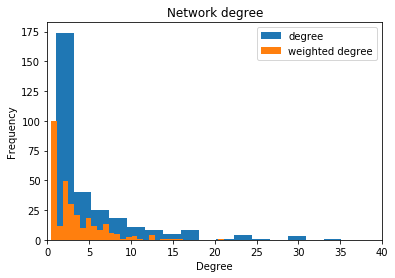

mean degree 5.026666666666666
mean strenght 3.325701689545516


NETWORK OF 2014-2018


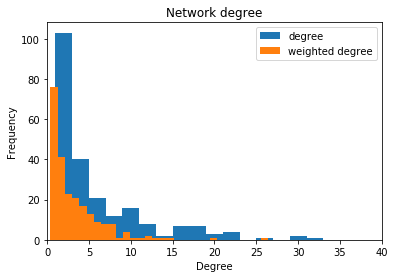

mean degree 6.104347826086957
mean strenght 3.3250012990964497


In [5]:
print ('NETWORK OF 2009-2013')
compare_degrees_strength(Gm_simple_2009_2013)
print()
print()
print ('NETWORK OF 2014-2018')
compare_degrees_strength(Gm_simple_2014_2018)

## Adjacency matrix:
### 2009-2013:

In [6]:
draw_adjacency_matrix(reduced_matrix_2009_2013,['StartIndst','FinalIndst'],'weight')

### 2014-2018:

In [7]:
draw_adjacency_matrix(reduced_matrix_2014_2018,['StartIndst','FinalIndst'],'weight')

# Network visualisation: by main industry

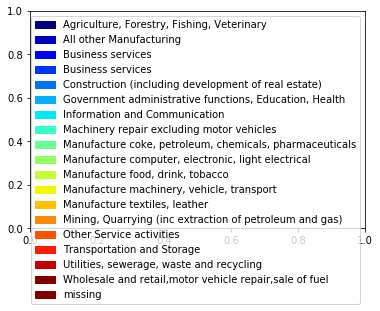

0

In [8]:
draw_network_by_classification(Gm_simple_2009_2013,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2013_flows/network_industry.png)


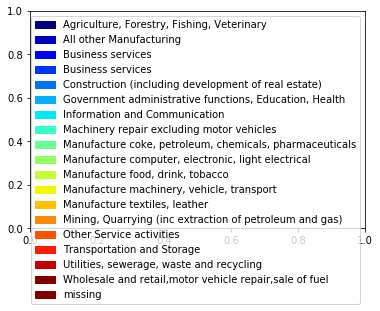

0

In [9]:
draw_network_by_classification(Gm_simple_2014_2018,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_industry.png)


## Network visualisation: by community
## 2009 -2013:

In [10]:
network_components_2009_2013 = Gm_simple_2009_2013.components()
network_largest_2009_2013 = network_components_2009_2013.subgraphs()[0]


In [11]:
net_community_2009_2013 = network_largest_2009_2013.community_multilevel(weights=network_largest_2009_2013.es['weight'])
print ('Modularity',net_community_2009_2013.modularity)

Modularity 0.6324268271415231


In [12]:
draw_and_print_communities(network_largest_2009_2013,net_community_2009_2013,'../img/'+label1+'/network_community.png')

Community : 1
['General public administration', 'Primary', 'Technical, vocational secondary', 'General secondary', 'Other education nec', 'Fire service activities', 'Operation of sports facilities', 'Activities of sport clubs', 'Religious organisations', 'Post-secondary non-tertiary', 'Fitness facilities', 'Botanical/zoo gardens/reserves', 'Museum activities', 'Performing arts', 'Other sports activities', 'Other amusement, recreation', 'Library and archive activities', 'Educational support activities', 'Tertiary', 'Beverage serving', 'Hotels and similar', 'Travel agency activities', 'Hairdressing, beauty treatment', 'Justice, judicial activities', 'Veterinary activities', 'Translation, interpretation', 'Passenger air transport', 'Tour operator activities', 'Landscape service activities', 'Sports, recreation education']

Community : 2
['Other', 'Child day-care', 'Other nec', 'Households as employers', 'Dental practices', 'Other', 'Pre-primary', 'Hospital activities', 'Other', 'Elderly, 

## 2014 - 2018:



In [13]:
network_components_2014_2018 = Gm_simple_2014_2018.components()
network_largest_2014_2018 = network_components_2014_2018.subgraphs()[0]
net_community_2014_2018 = network_largest_2014_2018.community_multilevel(weights=network_largest_2014_2018.es['weight'])

print ('Modularity',net_community_2014_2018.modularity)


Modularity 0.6093126267719118


In [14]:
draw_and_print_communities(network_largest_2014_2018,net_community_2014_2018,'../img/'+label2+'/network_community.png')

Community : 1
['Tertiary', 'General public administration', 'Primary', 'General secondary', 'Technical, vocational secondary', 'Other education nec', 'Religious organisations', 'Post-secondary non-tertiary', 'Educational support activities', 'Library and archive activities', 'Other natural sciences, engineering', 'Pharmaceutical preparations', 'Pharmaceutical goods', 'Fire service activities', 'Compulsory social security activities', 'Defence activities', 'missing', 'Museum activities', 'Social sciences, humanities']

Community : 2
['Dispensing chemist', 'Dental practices', 'Other nec', 'Other amusement, recreation', 'Restaurants, mobile food service', 'Food, beverages, tobacco mainly', 'Clothing', 'Beverage serving', 'Other non specialised', 'Gambling, betting activities', 'Under universal service obligation', 'Hardware, paints, glass', 'Hairdressing, beauty treatment', 'Other new goods', 'Furniture, lighting, other', 'Water collection, treatment, supply', 'Watches, jewellery', 'Via m

### 2009 - 2013:

!['something here'](../img/Table1_Reduced_matrix_2009_2013_flows/network_community.png)


### 2014 - 2018:


![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_community.png)
